In [6]:
from google.colab import drive

# This will prompt you to click on a link and generate an authorization code.
drive.mount('/content/drive')

Mounted at /content/drive


#  **Lending Club Case Study**
---
### **Problem Statement**
---

> You work for a consumer finance company which specialises in lending various types of loans to urban customers. When the company receives a loan application, the company has to make a decision for loan approval based on the applicant’s profile. Two types of risks are associated with the bank’s decision:
*   If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company.
*   If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company.

**In this case study, you will use EDA to understand how consumer attributes and loan attributes influence the tendency of default.**



## **Understanding, Cleaning and Manipulating the provided data**

---


In [7]:
# Importing the necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [8]:
# Reading the csv file
lending_data = pd.read_csv('/content/drive/MyDrive/Case Study/loan.csv')
lending_data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [9]:
# checking the shape of the dataframe
lending_data.shape

(39717, 111)

In [10]:
# Checking the null columns
lending_data.isnull().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 111, dtype: int64

### **Dropping NULL columns**

---



> After analying the the shape of the given dataframe, there seemed to be some columns which have all the values as **NULL** so those columns won't help us in data analysis so descarding them.



In [11]:
# Dropping the NULL columns
lending_data.dropna(how = 'all', axis = 1, inplace = True)
lending_data.isnull().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
term                              0
int_rate                          0
installment                       0
grade                             0
sub_grade                         0
emp_title                      2459
emp_length                     1075
home_ownership                    0
annual_inc                        0
verification_status               0
issue_d                           0
loan_status                       0
pymnt_plan                        0
url                               0
desc                          12940
purpose                           0
title                            11
zip_code                          0
addr_state                        0
dti                               0
delinq_2yrs                       0
earliest_cr_line                  0
inq_last_6mths              

In [12]:
# Checking the number of unique values per column.
lending_data.nunique()

id                            39717
member_id                     39717
loan_amnt                       885
funded_amnt                    1041
funded_amnt_inv                8205
term                              2
int_rate                        371
installment                   15383
grade                             7
sub_grade                        35
emp_title                     28820
emp_length                       11
home_ownership                    5
annual_inc                     5318
verification_status               3
issue_d                          55
loan_status                       3
pymnt_plan                        1
url                           39717
desc                          26527
purpose                          14
title                         19615
zip_code                        823
addr_state                       50
dti                            2868
delinq_2yrs                      11
earliest_cr_line                526
inq_last_6mths              

### **Dropping the single valued columns**

---
> In the result of the nunique() function there seemed some columns which has single values in it and those columns won't be helping in analysis so dropping them would be right decision.



In [13]:
# Dropping the single valued columns
Single_valued_columns = lending_data.loc[:,(lending_data.nunique() == 1)]
lending_data.drop(Single_valued_columns, axis = 1, inplace = True)
lending_data.nunique()

id                         39717
member_id                  39717
loan_amnt                    885
funded_amnt                 1041
funded_amnt_inv             8205
term                           2
int_rate                     371
installment                15383
grade                          7
sub_grade                     35
emp_title                  28820
emp_length                    11
home_ownership                 5
annual_inc                  5318
verification_status            3
issue_d                       55
loan_status                    3
url                        39717
desc                       26527
purpose                       14
title                      19615
zip_code                     823
addr_state                    50
dti                         2868
delinq_2yrs                   11
earliest_cr_line             526
inq_last_6mths                 9
mths_since_last_delinq        95
mths_since_last_record       111
open_acc                      40
pub_rec   

In [14]:
# Closely checking all the columns dataset
lending_data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,Jun-16,May-16,0.0


In [15]:
# Checking the types of categories we have for loan status
lending_data.loan_status.unique()

array(['Fully Paid', 'Charged Off', 'Current'], dtype=object)

### **Removing the Current loan data**
---
> After going through the data we can see that there are 3 categories of loan data current, fully paid and charged off now as per the requirements we are suppose to find the insights from the borrowers who has already either defaulted or paid their loans fully as they will give us the patterns regarding what kind of behavious is likely to lead to defaults so we are dropping current loans data.



In [16]:
# Dropping the rows where loan status equals to "current"
lending_data.drop(lending_data[lending_data.loan_status == 'Current'].index, inplace = True)
lending_data.loan_status.unique()

array(['Fully Paid', 'Charged Off'], dtype=object)

In [17]:
lending_data.shape

(38577, 48)

In [18]:
# Checking columns for appropriate feature selection.
lending_data.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record',
       'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'next_pymnt_d', 'last_credit_pull_d', 'pub_rec_bankruptcies'],
      dtype='object')

### **Removing certain features considering the current business requirements.**

---

> * Since **"loan_amnt"** and **"funded_amnt"** are same and for the actual lended amount we have **"funded_amnt_inv"** we can safely remove **"funded_amnt"**.
* Removing **"id", "member_id", "emp_title", "url", "desc", "zip_code", "title"** as these are the kind of info which has no influence on having defaults.
* **"delinq_2yrs", "mths_since_last_delinq", "out_prncp", "out_prncp_inv", "total_pymnt", "total_pymnt_inv", "total_rec_prncp", "total_rec_int", "total_rec_late_fee", "last_pymnt_d", "last_pymnt_amnt", "next_pymnt_d"** these are basically used to analyze the users who have ongoing loans but here for making descision regarding the lending of the loans, these columns won't play much role.
* Removing **"revol_bal"** as we already have **"revol_util"** which is a better sustitute for it.
* **"recoveries", "collection_recovery_fee"** these are the field indicating how much amount was recovered from defaults so it won't play any role in Analysis.
* As we kept **"pub_rec"** which is total number of public record found, the **"mths_since_last_record"**, **"pub_rec_bankruptcies"** column seems redundant for the anaysis.
* **"last_credit_pull_d"** it is used for lender's internal record so it won't influence the behaviour of defaults so removing it.

In [19]:
# Removing unnecessary columns
lending_data.drop(["id", "member_id", "url", "title", "emp_title","mths_since_last_record",
                   "zip_code", "last_credit_pull_d", "desc", "out_prncp_inv",
                   "total_pymnt_inv","funded_amnt", "delinq_2yrs", "revol_bal",
                   "out_prncp", "total_pymnt", "total_rec_prncp", "total_rec_int",
                   "total_rec_late_fee", "recoveries", "collection_recovery_fee",
                   "last_pymnt_d", "last_pymnt_amnt", "next_pymnt_d" ,
                   "pub_rec_bankruptcies", "mths_since_last_delinq"], axis = 1, inplace = True)

In [20]:
# Final look at the Dataframe
from google.colab import data_table
data_table.DataTable(lending_data, max_columns = 22)

,loan_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,...,loan_status,purpose,addr_state,dti,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_util,total_acc
0,5000,4975.0,36 months,10.65%,162.87,B,B2,10+ years,RENT,24000.0,...,Fully Paid,credit_card,AZ,27.65,Jan-85,1,3,0,83.70%,9
1,2500,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,RENT,30000.0,...,Charged Off,car,GA,1.00,Apr-99,5,3,0,9.40%,4
2,2400,2400.0,36 months,15.96%,84.33,C,C5,10+ years,RENT,12252.0,...,Fully Paid,small_business,IL,8.72,Nov-01,2,2,0,98.50%,10
3,10000,10000.0,36 months,13.49%,339.31,C,C1,10+ years,RENT,49200.0,...,Fully Paid,other,CA,20.00,Feb-96,1,10,0,21%,37
5,5000,5000.0,36 months,7.90%,156.46,A,A4,3 years,RENT,36000.0,...,Fully Paid,wedding,AZ,11.20,Nov-04,3,9,0,28.30%,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,2500,1075.0,36 months,8.07%,78.42,A,A4,4 years,MORTGAGE,110000.0,...,Fully Paid,home_improvement,CO,11.33,Nov-90,0,13,0,13.10%,40
39713,8500,875.0,36 months,10.28%,275.38,C,C1,3 years,RENT,18000.0,...,Fully Paid,credit_card,NC,6.40,Dec-86,1,6,0,26.90%,9
39714,5000,1325.0,36 months,8.07%,156.84,A,A4,< 1 year,MORTGAGE,100000.0,...,Fully Paid,debt_consolidation,MA,2.30,Oct-98,0,11,0,19.40%,20
39715,5000,650.0,36 months,7.43%,155.38,A,A2,< 1 year,MORTGAGE,200000.0,...,Fully Paid,other,MD,3.72,Nov-88,0,17,0,0.70%,26


### **Checking the missing value percentage**

---



In [21]:
lending_data.isna().sum()/len(lending_data)*100

loan_amnt              0.000000
funded_amnt_inv        0.000000
term                   0.000000
int_rate               0.000000
installment            0.000000
grade                  0.000000
sub_grade              0.000000
emp_length             2.677761
home_ownership         0.000000
annual_inc             0.000000
verification_status    0.000000
issue_d                0.000000
loan_status            0.000000
purpose                0.000000
addr_state             0.000000
dti                    0.000000
earliest_cr_line       0.000000
inq_last_6mths         0.000000
open_acc               0.000000
pub_rec                0.000000
revol_util             0.129611
total_acc              0.000000
dtype: float64

### **Treatment for missing values**

---
> There are two columns which has missing values,
* emp_length ----> Categorical Data
* revol_util ----> Numeric Type Data  





In [22]:
lending_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38577 entries, 0 to 39716
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   loan_amnt            38577 non-null  int64  
 1   funded_amnt_inv      38577 non-null  float64
 2   term                 38577 non-null  object 
 3   int_rate             38577 non-null  object 
 4   installment          38577 non-null  float64
 5   grade                38577 non-null  object 
 6   sub_grade            38577 non-null  object 
 7   emp_length           37544 non-null  object 
 8   home_ownership       38577 non-null  object 
 9   annual_inc           38577 non-null  float64
 10  verification_status  38577 non-null  object 
 11  issue_d              38577 non-null  object 
 12  loan_status          38577 non-null  object 
 13  purpose              38577 non-null  object 
 14  addr_state           38577 non-null  object 
 15  dti                  38577 non-null 

* **Deleting the Null valued rows**

  > For numeric type data such as **"revol_util"**, which has very low NULL value percentage around 0.129611, so rather than Imputing them with any statstical metrics we can simply delete those entries.



In [23]:
lending_data = lending_data[lending_data.revol_util.notna()]
lending_data.revol_util.isna().sum()

0

In [24]:
# Analyzing the value counts of different categories of emp_length to see the difference between them.
print(lending_data.emp_length.value_counts())
print("MODE ---> ",lending_data.emp_length.mode()[0])

10+ years    8487
< 1 year     4496
2 years      4286
3 years      4008
4 years      3335
5 years      3190
1 year       3163
6 years      2165
7 years      1708
8 years      1433
9 years      1226
Name: emp_length, dtype: int64
MODE --->  10+ years


* **Imputing the missing values with MODE**
  
  > Now as per the Categorical data like **"emp_length"** which has roughly around 1033 null values so, rather than deleting them let's impute them using the MODE of the data as the difference between the MODE and second value to the MODE is quite high so it won't affect the analysis.



In [25]:
lending_data.fillna(lending_data.emp_length.mode()[0], inplace = True)
print("Null Values ---> ",lending_data.emp_length.isna().sum())
lending_data.emp_length.value_counts()

Null Values --->  0


10+ years    9517
< 1 year     4496
2 years      4286
3 years      4008
4 years      3335
5 years      3190
1 year       3163
6 years      2165
7 years      1708
8 years      1433
9 years      1226
Name: emp_length, dtype: int64

## **Standardizing the remaining Data**

---

In [26]:
# removing % sign from the revol_util column and converting it into float
lending_data.revol_util = lending_data.revol_util.astype(str)
lending_data.revol_util = lending_data.revol_util.apply(lambda x : x.split('%')[0]).astype(float)

In [27]:
# removing % sign from the int_rate column and converting it into float
lending_data.int_rate = lending_data.int_rate.astype(str)
lending_data.int_rate	= lending_data.int_rate.apply(lambda x : x.split('%')[0]).astype(float)

In [28]:
# Standardizing the emp_length column to only numeric form of years
import re
lending_data.emp_length = lending_data.emp_length.apply(lambda x : 0 if '<' in x else re.findall(r'\d+', x)[0])
lending_data.emp_length.value_counts()

10    9517
0     4496
2     4286
3     4008
4     3335
5     3190
1     3163
6     2165
7     1708
8     1433
9     1226
Name: emp_length, dtype: int64

## **Outlier Treatment**

---

In [29]:
# Setting the color palette
sns.set_palette(sns.color_palette("Set2"))

In [30]:
# Defining Outlier finder method which is based on IQR concept.
def find_outliers(df, column_name):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return lower_bound, upper_bound

In [31]:
# Defining the method to showcase the comparison plots before and after the removal of outliers.
def outlier_compare_plot(df, column_name, log_scale = False):
    # Calculate before_data using original data
    before_data = df[column_name]

    # Find outliers and get the high value
    low, high = find_outliers(df, column_name)

    # Filter out outliers and get after_data
    after_data = df[(df[column_name]>low)&(df[column_name]<=high)][column_name]

    # Checking the log_scale parameter
    if log_scale:
      before_data = np.log(before_data)
      after_data = np.log(after_data)
      Ylable = 'Log Scale Value'
    else:
      Ylable = 'Value'

    # Create a DataFrame with 'before' and 'after' labels
    data = pd.DataFrame({'Value': list(before_data) + list(after_data),
          'Group': ['Before'] * len(before_data) + ['After'] * len(after_data)})

    # Create a boxplot
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='Group', y='Value', data=data)

    # Add labels and title
    plt.ylabel(Ylable)
    plt.title('Before and After Comparison of {}'.format(column_name))

    # Show plot
    plt.show()

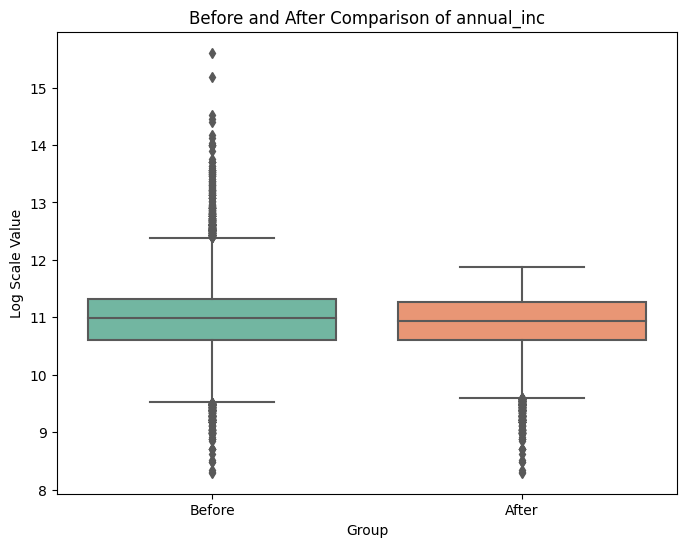

In [32]:
# Comparing the distribution of annual_inc before and after removing outliers
outlier_compare_plot(lending_data, 'annual_inc', log_scale = True)

* **Removing outliers from "annual_inc" column as there is clear influence in compare-plot**



In [33]:
# Find outliers and get the low and high values
low, high = find_outliers(lending_data, 'annual_inc')

# Filter out outliers
lending_data = lending_data[(lending_data.annual_inc>=low)&(lending_data.annual_inc<=high)]
lending_data.shape

(36766, 22)

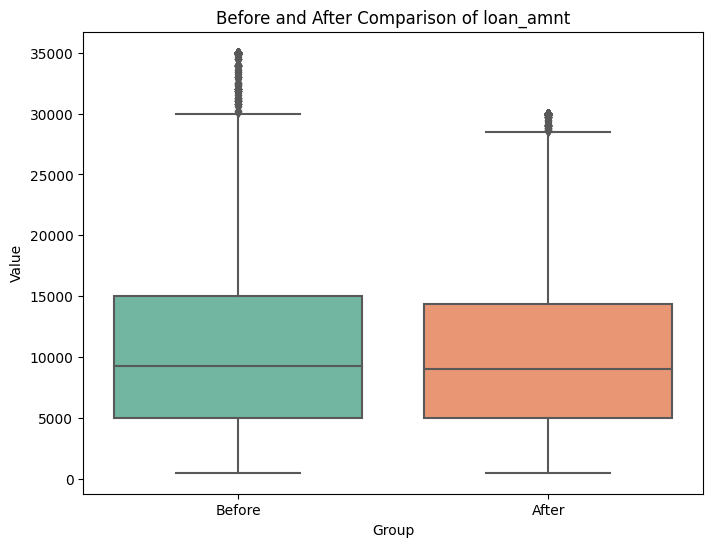

In [34]:
# Comparing the distribution of loan_amnt before and after removing outliers
outlier_compare_plot(lending_data, 'loan_amnt')

* **No need to remove outliers from "loan_amnt" column as the extreme values are pretty much continous in nature and there is not much impact of those extremes on the plot.**



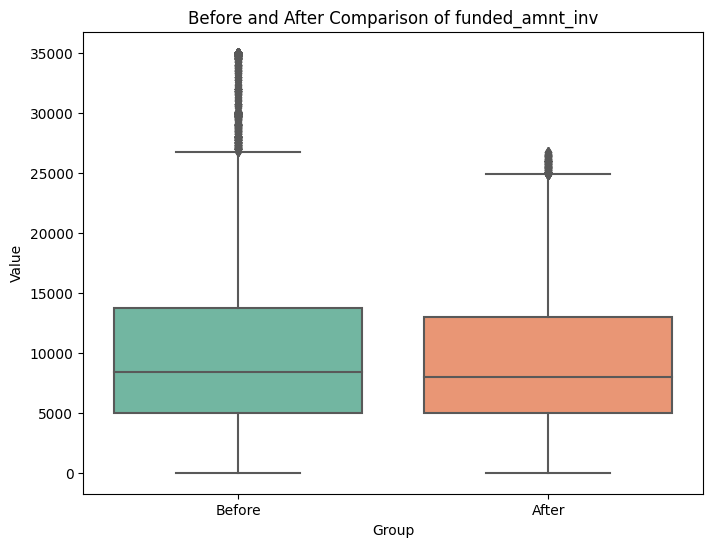

In [35]:
# Comparing the distribution of funded_amnt_inv before and after removing outliers
outlier_compare_plot(lending_data, 'funded_amnt_inv')

* **No need to remove outliers from "funded_amnt_inv" column as the extreme values are pretty much continous in nature and there is not much impact of those extremes on the plot.**



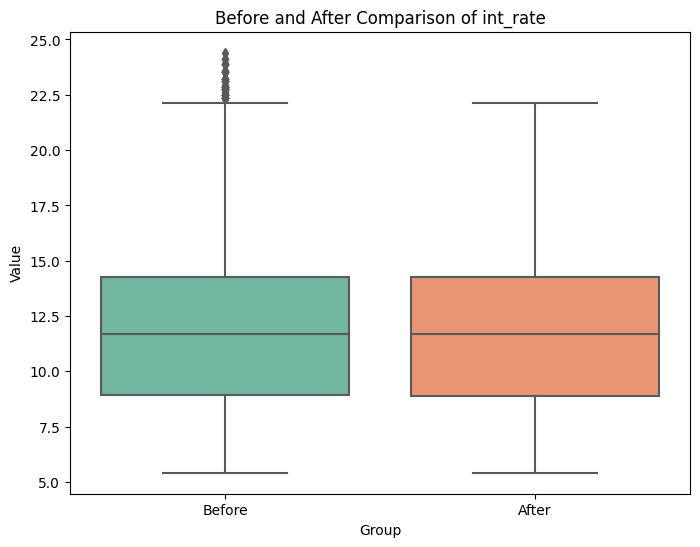

In [36]:
# Comparing the distribution of int_rate before and after removing outliers
outlier_compare_plot(lending_data, 'int_rate')

* **No need to remove outliers from "int_rate" column as the extreme values are pretty much continous in nature and there is not much impact of those extremes on the plot.**



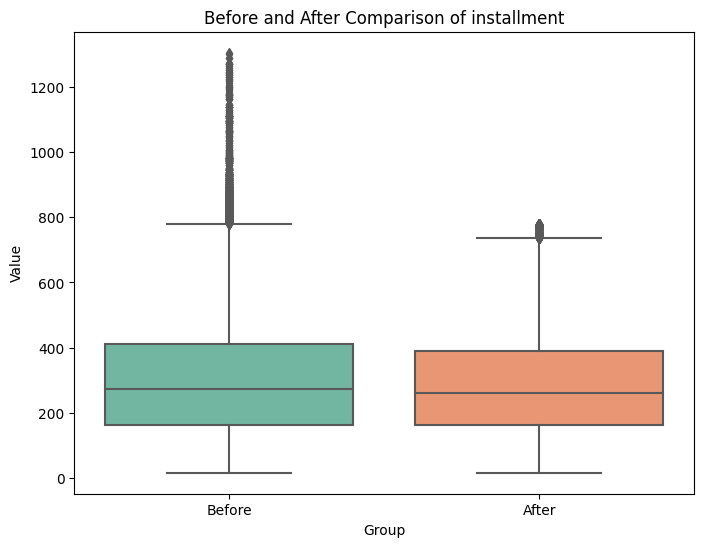

In [37]:
# Comparing the distribution of installment before and after removing outliers
outlier_compare_plot(lending_data, 'installment')

* **No need to remove outliers from "installment" column as the extreme values are pretty much continous in nature and there is not much impact of those extremes on the plot.**





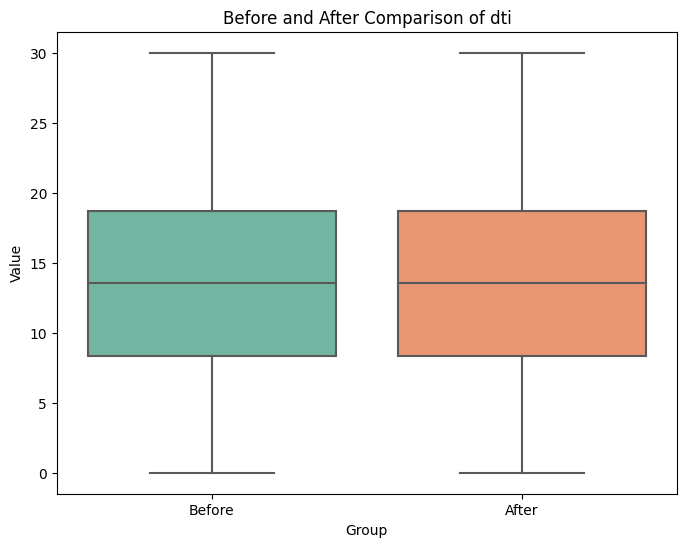

In [38]:
# Comparing the distribution of dti before and after removing outliers
outlier_compare_plot(lending_data, 'dti')

* **No need to Remove outliers from "dti" column as there is no clear influence in compare-plot**

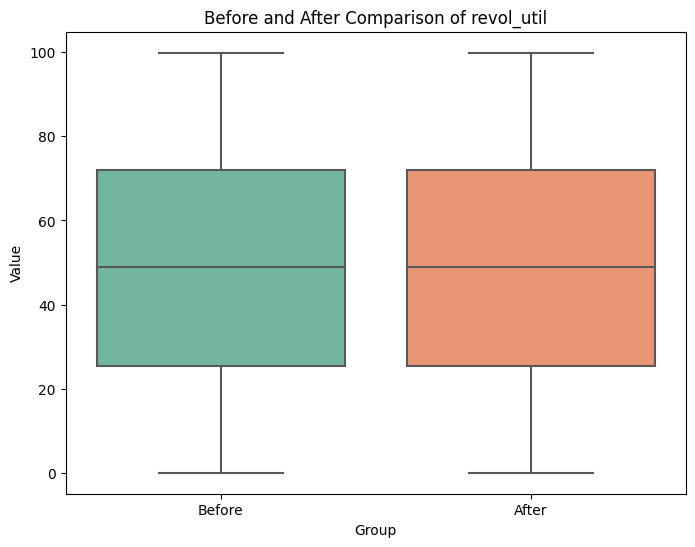

In [39]:
# Comparing the distribution of revol_util before and after removing outliers
outlier_compare_plot(lending_data, 'revol_util')

* **No need to Remove outliers from "revol_util" column as there is no clear influence in compare-plot**

## **Analysing the data**

---


In [40]:
lending_data.loan_status.unique()
lending_data.columns

Index(['loan_amnt', 'funded_amnt_inv', 'term', 'int_rate', 'installment',
       'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose',
       'addr_state', 'dti', 'earliest_cr_line', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_util', 'total_acc'],
      dtype='object')

### **Doing Univariate and Segmented Univariate Analysis on some categorical columns.**

> **Categorical Columns**
*   'term'                       
*   'verification_status'
*   'purpose'
*   'addr_state'
*   'emp_length'
*   'grade'
*   'sub_grade'
*   'home_ownership'

Analysing all these feature against the data where loan_status is "Charged Off" to find the insights specifically regarding the defaulters.

---



In [41]:
# Setting color palette
sns.set_palette(sns.color_palette("bright",60))

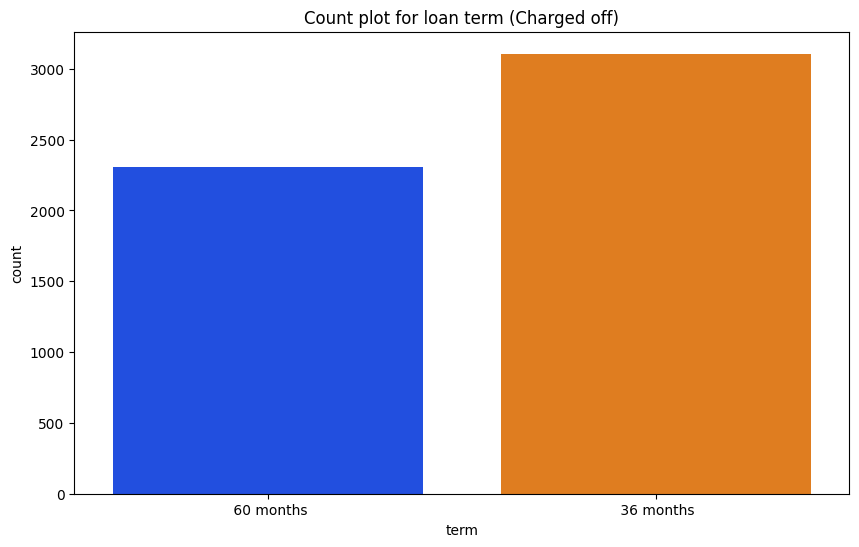

In [42]:
# Plotting count plot for loan term
plt.figure(figsize=(10, 6))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'], x='term')
plt.title('Count plot for loan term (Charged off)')
plt.show()

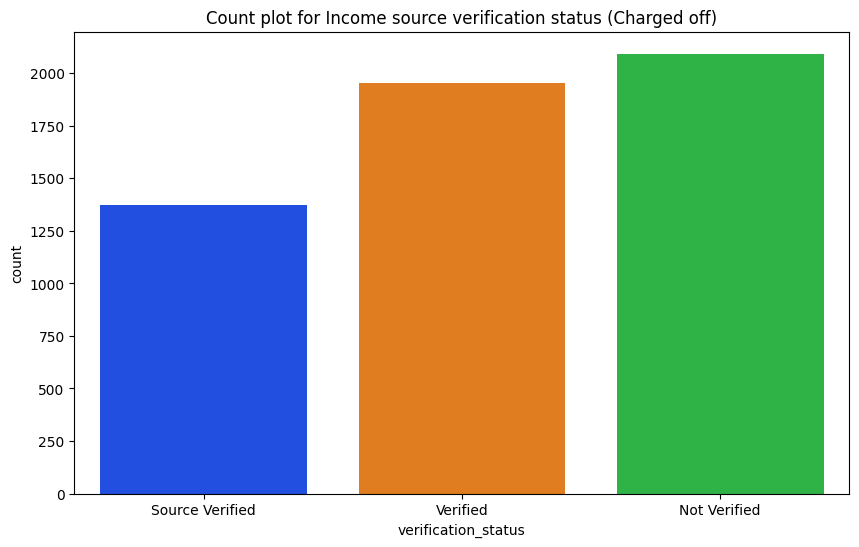

In [43]:
# Plotting count plot for verification status of the borrower
plt.figure(figsize=(10, 6))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'], x='verification_status')
plt.title('Count plot for Income source verification status (Charged off)')
plt.show()

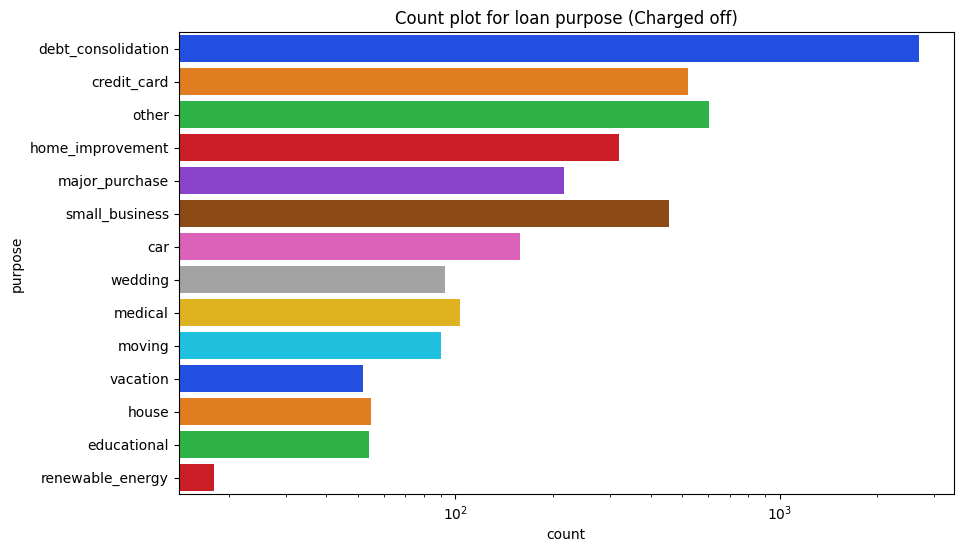

In [44]:
# Plotting count plot for purpose of the taking loan
plt.figure(figsize=(10, 6))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              y='purpose', order=lending_data.purpose.value_counts().index)
plt.xscale('log')
plt.title('Count plot for loan purpose (Charged off)')
plt.show()

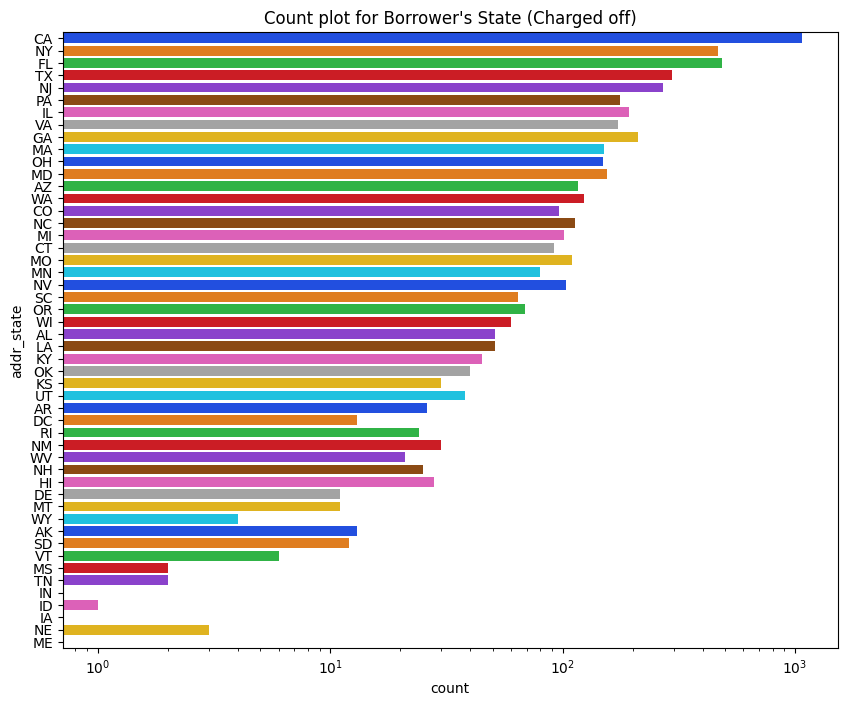

In [45]:
# Plotting count plot for residence state of the borrower
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              y='addr_state', order=lending_data.addr_state.value_counts().index)
plt.xscale('log')
plt.title('Count plot for Borrower\'s State (Charged off)')
plt.show()

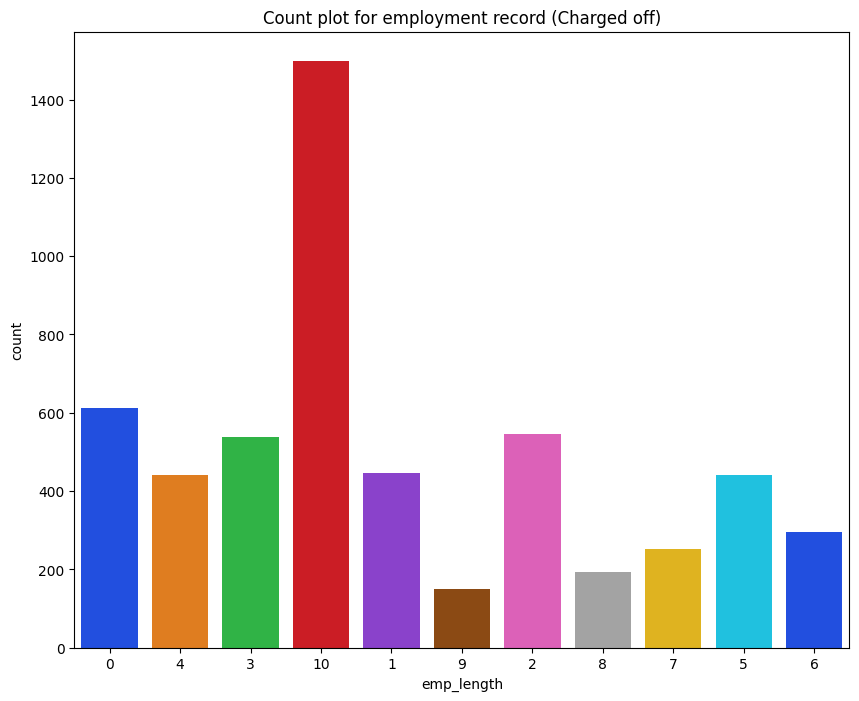

In [46]:
# Plotting count plot for employement of borrower
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='emp_length')
plt.title('Count plot for employment record (Charged off)')
plt.show()

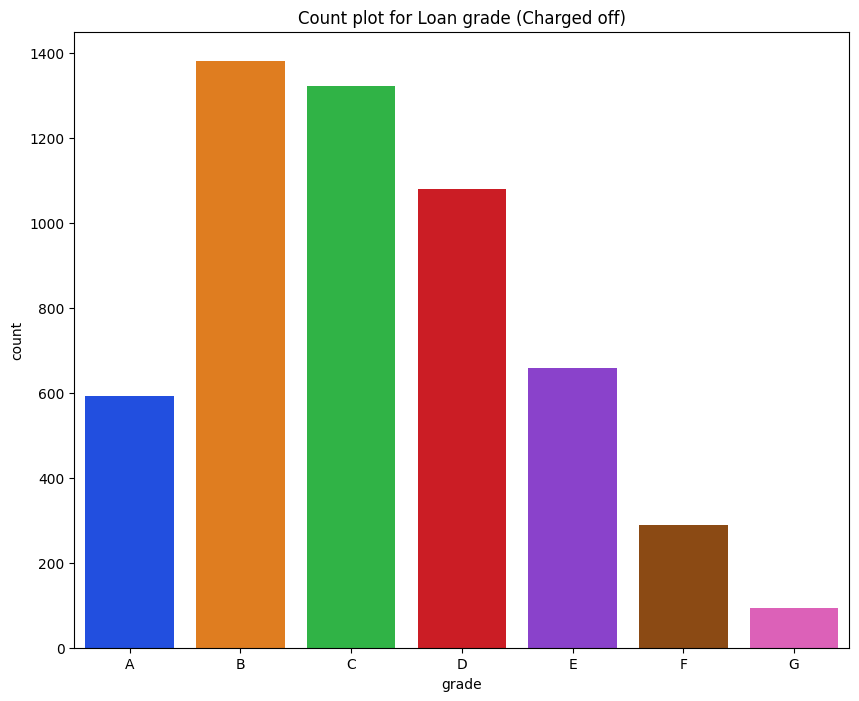

In [47]:
# Plotting count plot for loan grade
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='grade', order=['A','B','C','D','E','F','G'])
plt.title('Count plot for Loan grade (Charged off)')
plt.show()

In [48]:
# Stadardizing subgrade data
lending_data.sub_grade = lending_data.sub_grade.astype(str)
lending_data.sub_grade = lending_data.sub_grade.apply(lambda x : x[-1]).astype(int)

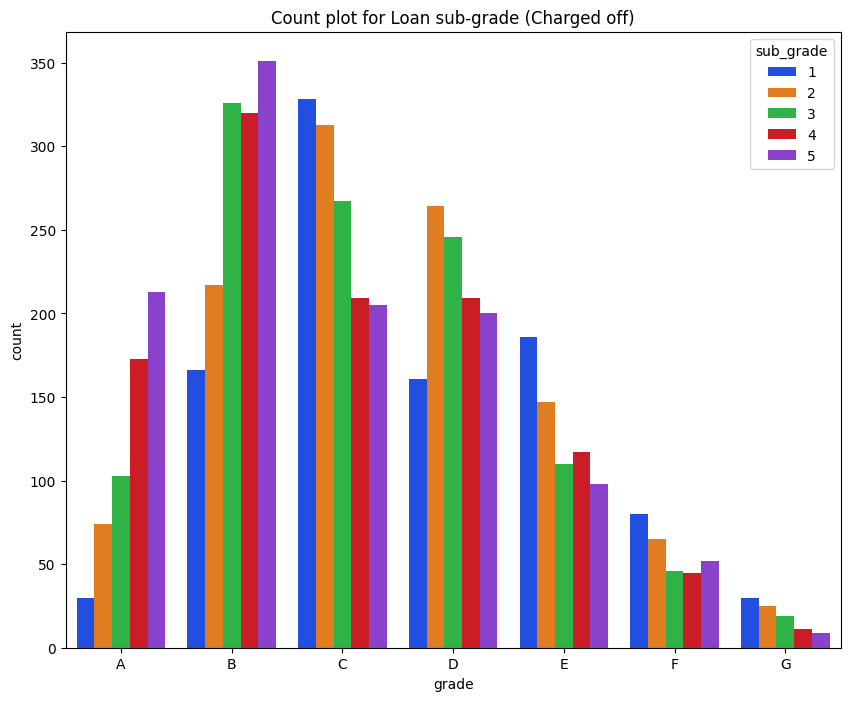

In [49]:
# Plotting count plot for loan grade wrt the sub grades
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='grade', order=['A','B','C','D','E','F','G'], hue='sub_grade')
plt.title('Count plot for Loan sub-grade (Charged off)')
plt.show()

In [50]:
lending_data.home_ownership.value_counts()

RENT        18031
MORTGAGE    15784
OWN          2857
OTHER          91
NONE            3
Name: home_ownership, dtype: int64

* **As there are only 3 records of NONE residence type so lets just merge them with OTHER type of data.**

In [51]:
lending_data['home_ownership'].replace(to_replace=['NONE'], value='OTHER', inplace=True)
lending_data.home_ownership.value_counts()

RENT        18031
MORTGAGE    15784
OWN          2857
OTHER          94
Name: home_ownership, dtype: int64

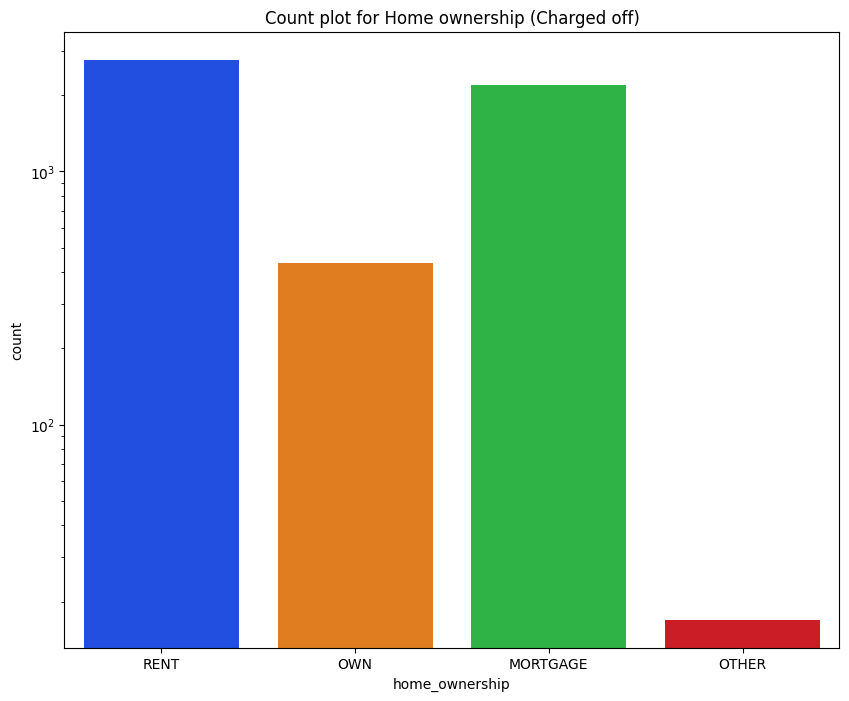

In [52]:
# Plotting count plot for home ownership of borrower
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='home_ownership')
plt.title('Count plot for Home ownership (Charged off)')
plt.yscale('log')
plt.show()

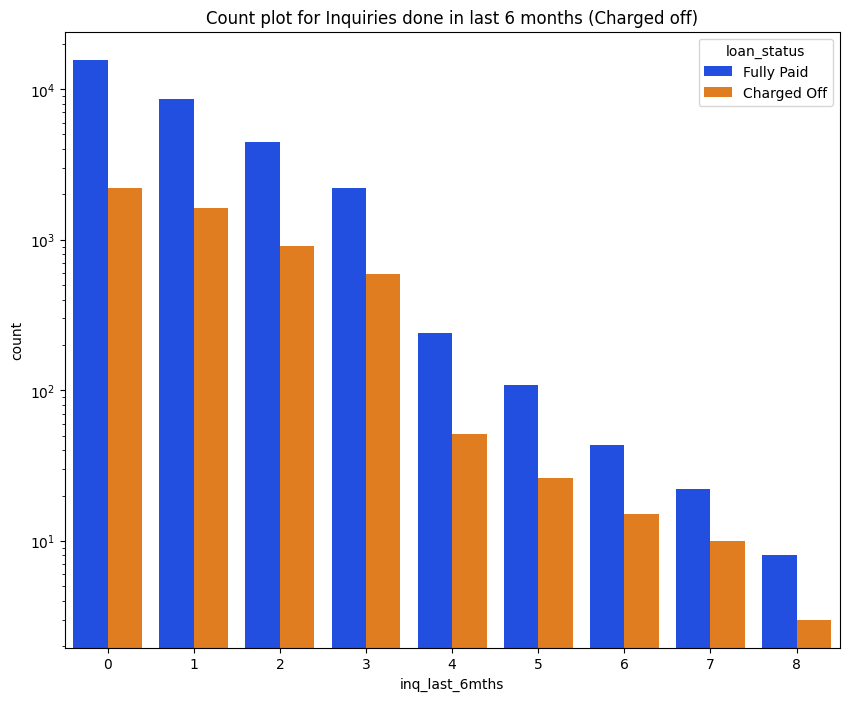

In [53]:
# Plotting count plot for number of inquiries done on borrower in last 6 months
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data, x='inq_last_6mths', hue='loan_status')
plt.title('Count plot for Inquiries done in last 6 months (Charged off)')
plt.yscale('log')
plt.show()


*   **Apart from these features issue_date is one such column which can be converted into categorical column by seperating month and year.**




In [54]:
# Deriving the seperate month and year features from issue_date column
lending_data['issue_month'] = lending_data.issue_d.apply(lambda date : date.split('-')[0])
lending_data['issue_year'] = lending_data.issue_d.apply(lambda date : '20' + date.split('-')[1])

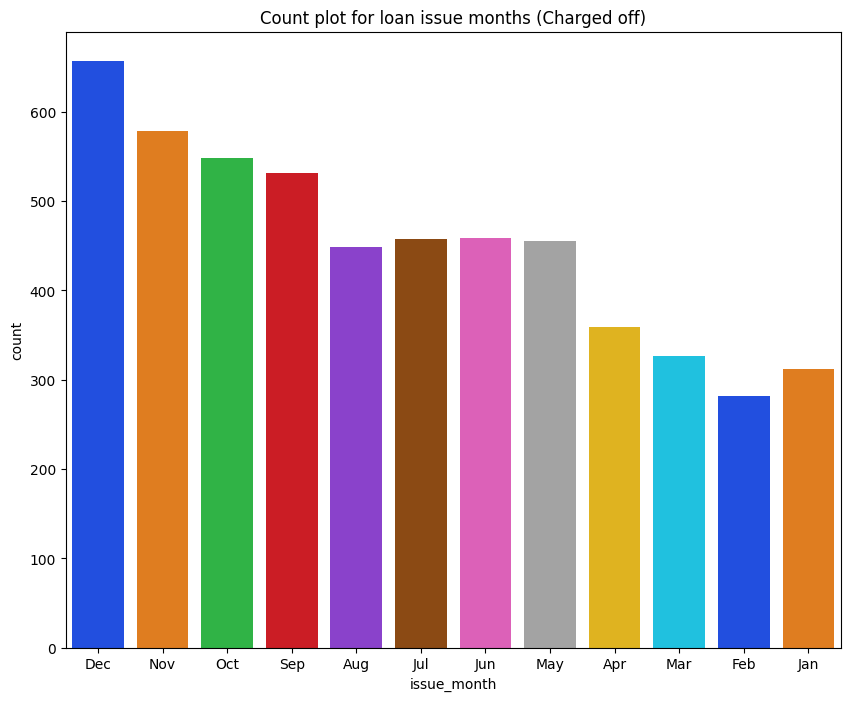

In [55]:
# Plotting count plot for loan issue month
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='issue_month')
plt.title('Count plot for loan issue months (Charged off)')
plt.show()

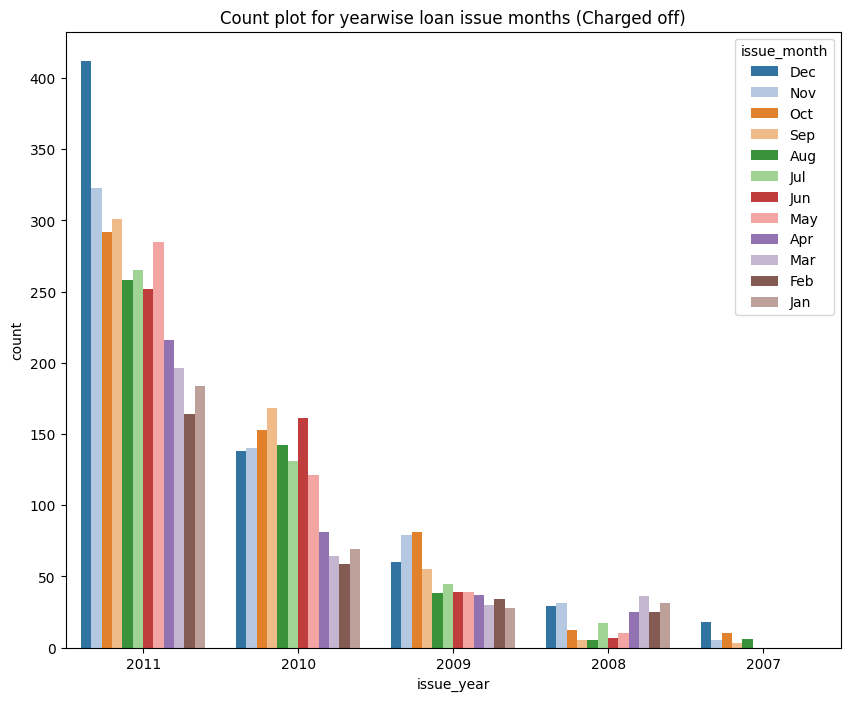

In [56]:
# Plotting count plot for loan issue year
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='issue_year', hue='issue_month', palette='tab20')
plt.title('Count plot for yearwise loan issue months (Charged off)')
plt.show()

### **Let's work on some Numeric type columns by corelating them with each other**

---

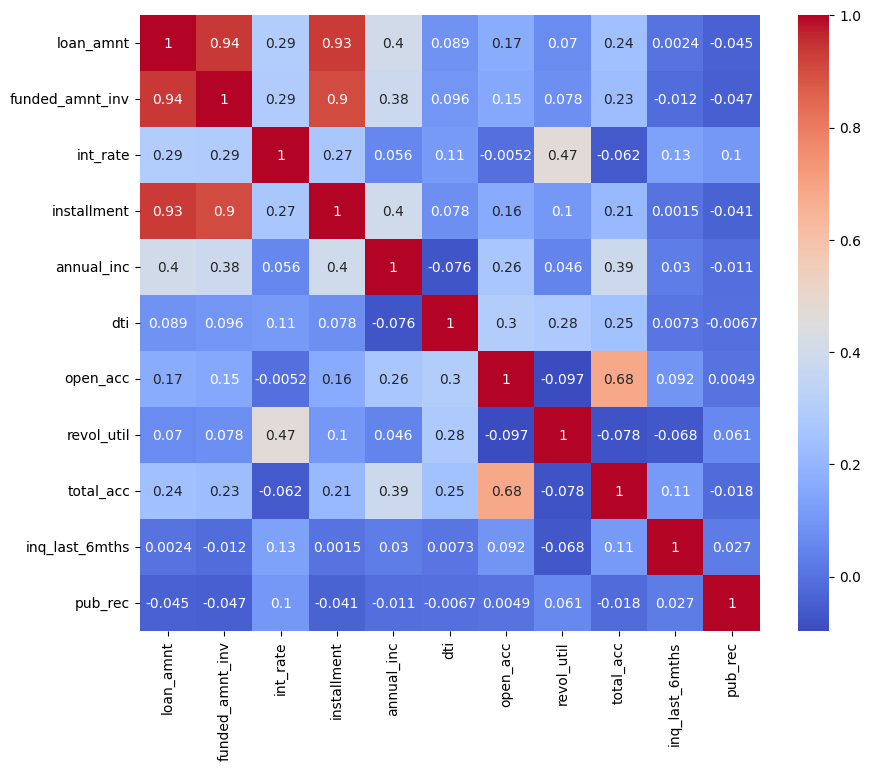

In [57]:
# Plotting corelation plot between numeric columns
plt.figure(figsize=(10, 8))
corelation_map = lending_data[['loan_amnt', 'funded_amnt_inv', 'int_rate',
                               'installment', 'annual_inc', 'dti', 'open_acc',
                               'revol_util', 'total_acc','earliest_cr_line',
                               'inq_last_6mths', 'pub_rec']].corr()
sns.heatmap(data=corelation_map , annot=True, cmap="coolwarm")
plt.show()

* **There are very high corelation between some columns and relatively some has very low corelation or opposite we can say, this can be used for bivariate analysis to select appropriate features for analysis.**



### **Categorizing numeric type columns**

---

> As the data set is quite huge, so to analyze the numeric type data properly we can categorize them into some bins.


*   'loan_amnt'
*   'funded_amnt_inv'
*   'int_rate'
*   'installment'
*   'annual_inc'
*   'dti'
*   'open_acc'
*   'revol_util'
*   'total_acc'







In [58]:
# Defining method to generate equal bins.
import numpy as np
import math

def create_bins(df, column, n, ranges=False):
    min_value = df[column].min()
    max_value = df[column].max()
    bins = np.linspace(min_value, max_value, n+1)
    bins = ceiled_list = [math.ceil(x) for x in bins]
    if ranges:
      bins = [str(bins[i])+'-'+str(bins[i+1]) for i in range(0,len(bins)-1)]
    return bins

In [59]:
# Creating bins for installment column
bins = create_bins(lending_data, 'installment', 10, ranges=True)

# Segregating the data into bins
lending_data['installment_seg'] = pd.cut(lending_data.installment, bins=10,
                                         precision=0, labels=bins)

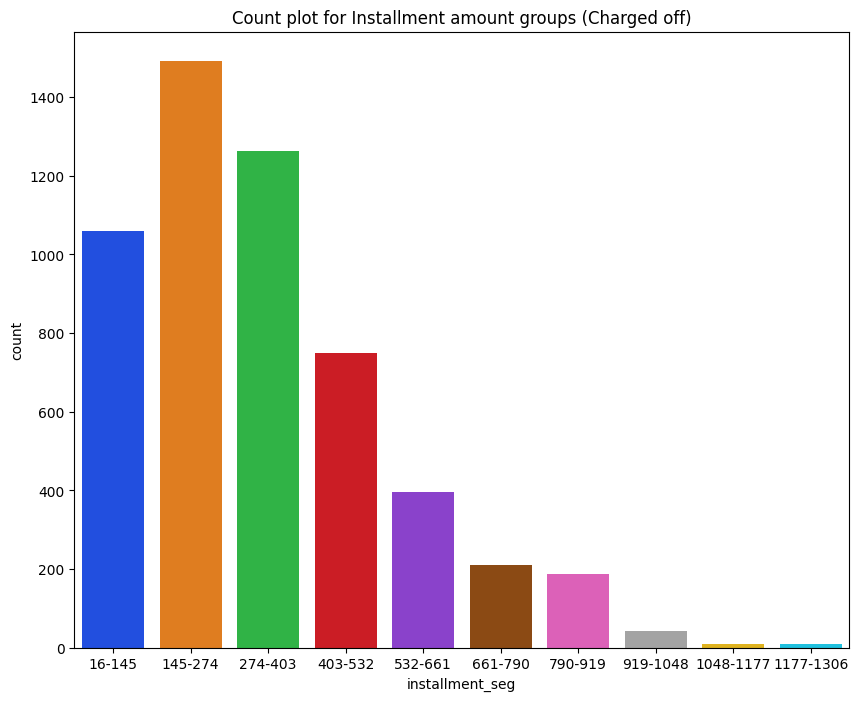

In [60]:
# Plotting count plot for installment amount
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='installment_seg')
plt.title('Count plot for Installment amount groups (Charged off)')
plt.show()

In [61]:
# Creating bins for funded_amnt_inv column
bins = create_bins(lending_data, 'funded_amnt_inv', 8, ranges=True)

# Segregating the data into bins
lending_data['funded_amnt_inv_seg'] = pd.cut(lending_data.funded_amnt_inv, bins=8,
                                         precision=0, labels=bins)

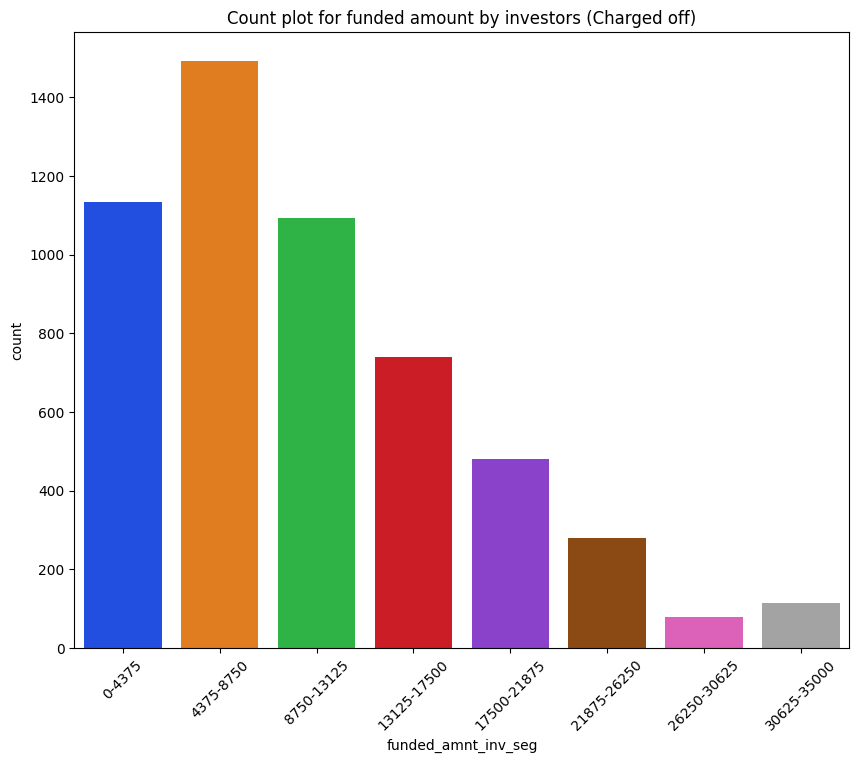

In [62]:
# Plotting count plot for funded amount by investors
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='funded_amnt_inv_seg')
plt.title('Count plot for funded amount by investors (Charged off)')
plt.xticks(rotation=45)
plt.show()

In [63]:
# Creating bins for int_rate column
bins = create_bins(lending_data, 'int_rate', 5)

# Creating ranges for bins
bins = [str(bins[i])+'%-'+str(bins[i+1])+'%' for i in range(0,len(bins)-1)]
# Segregating the data into bins
lending_data['int_rate_seg'] = pd.cut(lending_data.int_rate, bins=5,
                                         precision=0, labels=bins)

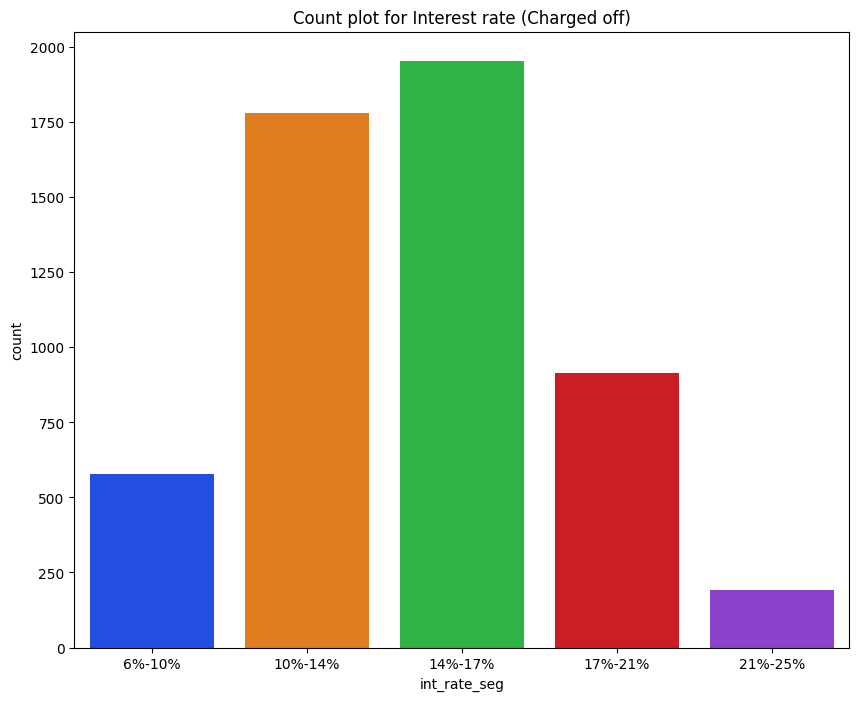

In [64]:
# Plotting count plot for interest rate
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='int_rate_seg')
plt.title('Count plot for Interest rate (Charged off)')
plt.show()

In [65]:
# Creating bins for loan_amnt column
bins = create_bins(lending_data, 'loan_amnt', 7, ranges=True)

# Segregating the data into bins
lending_data['loan_amnt_seg'] = pd.cut(lending_data.loan_amnt, bins=7,
                                         precision=0, labels=bins)

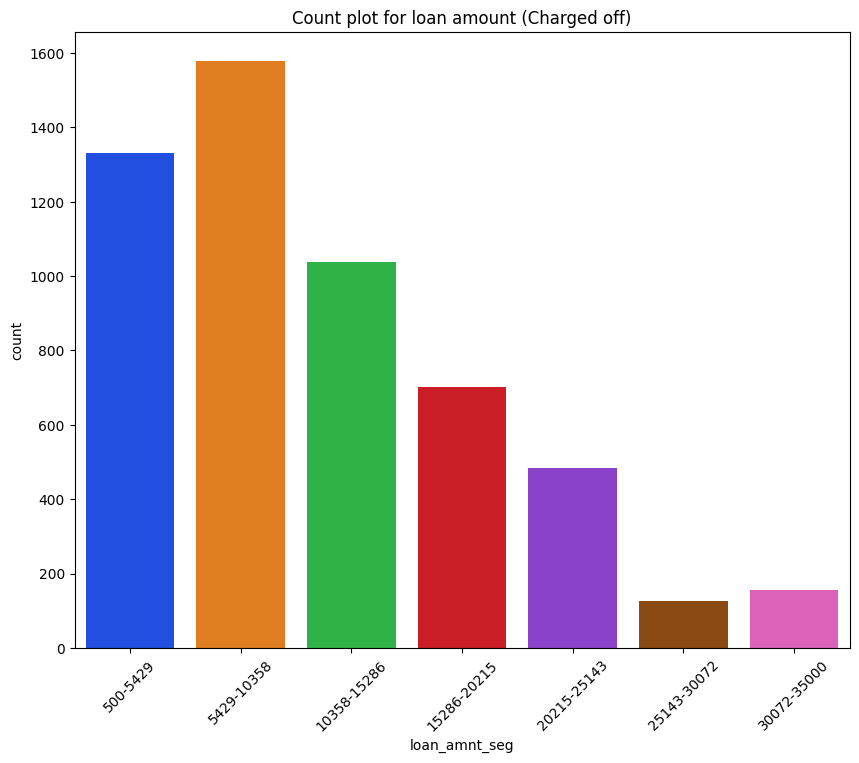

In [66]:
# Plotting count plot for loan amount
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='loan_amnt_seg')
plt.title('Count plot for loan amount (Charged off)')
plt.xticks(rotation=45)
plt.show()

In [67]:
# Creating bins for annual_inc column
bins = create_bins(lending_data, 'annual_inc', 5, ranges=True)

# Segregating the data into bins
lending_data['annual_inc_seg'] = pd.cut(lending_data.annual_inc, bins=5,
                                         precision=0, labels=bins)

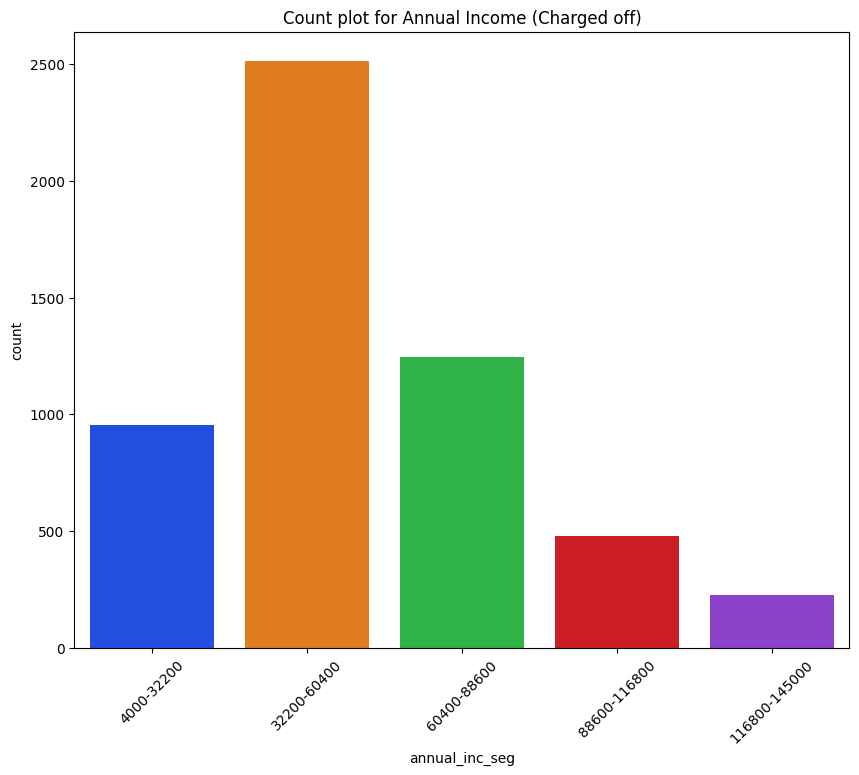

In [68]:
# Plotting count plot for Annual Income
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='annual_inc_seg')
plt.title('Count plot for Annual Income (Charged off)')
plt.xticks(rotation=45)
plt.show()

In [69]:
# Creating bins for dti column
bins = create_bins(lending_data, 'dti', 5, ranges=True)

# Segregating the data into bins
lending_data['dti_seg'] = pd.cut(lending_data.annual_inc, bins=5,
                                         precision=0, labels=bins)

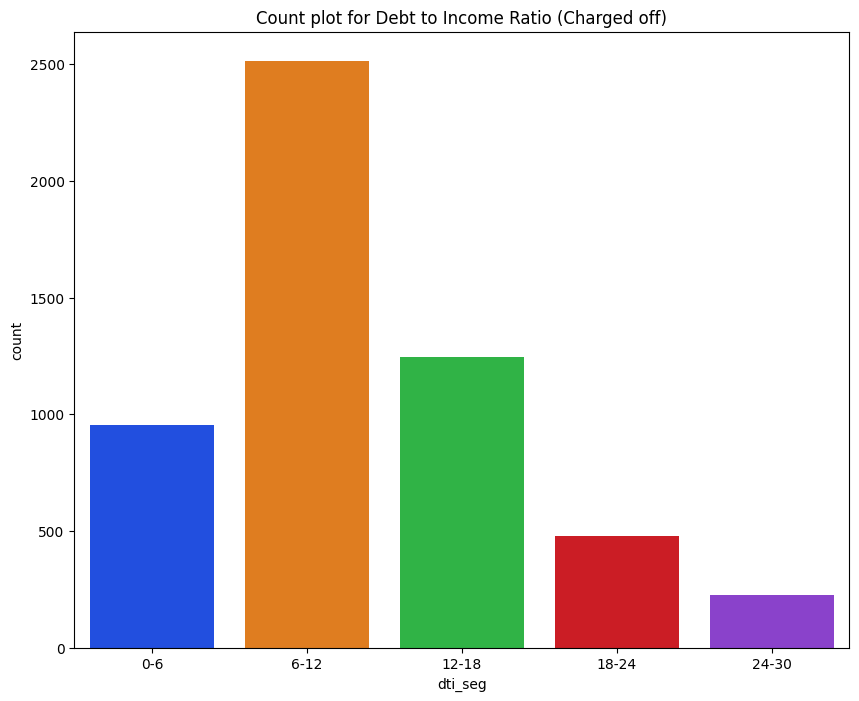

In [70]:
# Plotting count plot for debt to income ratio
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='dti_seg')
plt.title('Count plot for Debt to Income Ratio (Charged off)')
plt.show()

In [71]:
# Creating bins for open_acc column
bins = create_bins(lending_data, 'open_acc', 5, ranges=True)

# Segregating the data into bins
lending_data['open_acc_seg'] = pd.cut(lending_data.open_acc, bins=5,
                                         precision=0, labels=bins)

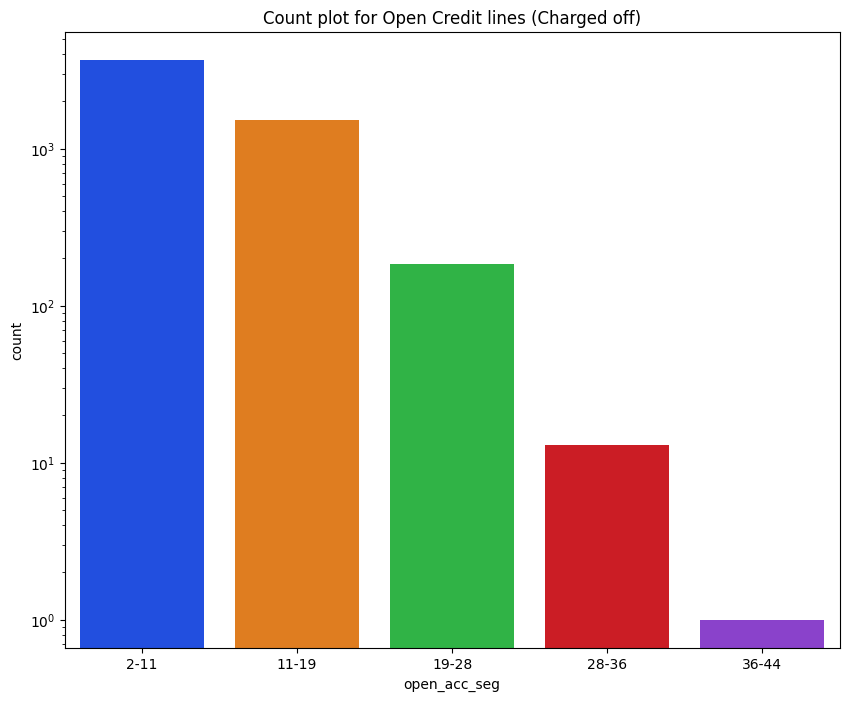

In [72]:
# Plotting count plot for number total open credit accounts
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='open_acc_seg')
plt.title('Count plot for Open Credit lines (Charged off)')
plt.yscale('log')
plt.show()

In [73]:
# Creating bins for revol_util column
bins = create_bins(lending_data, 'revol_util', 5, ranges=True)

# Segregating the data into bins
lending_data['revol_util_seg'] = pd.cut(lending_data.revol_util, bins=5,
                                         precision=0, labels=bins)

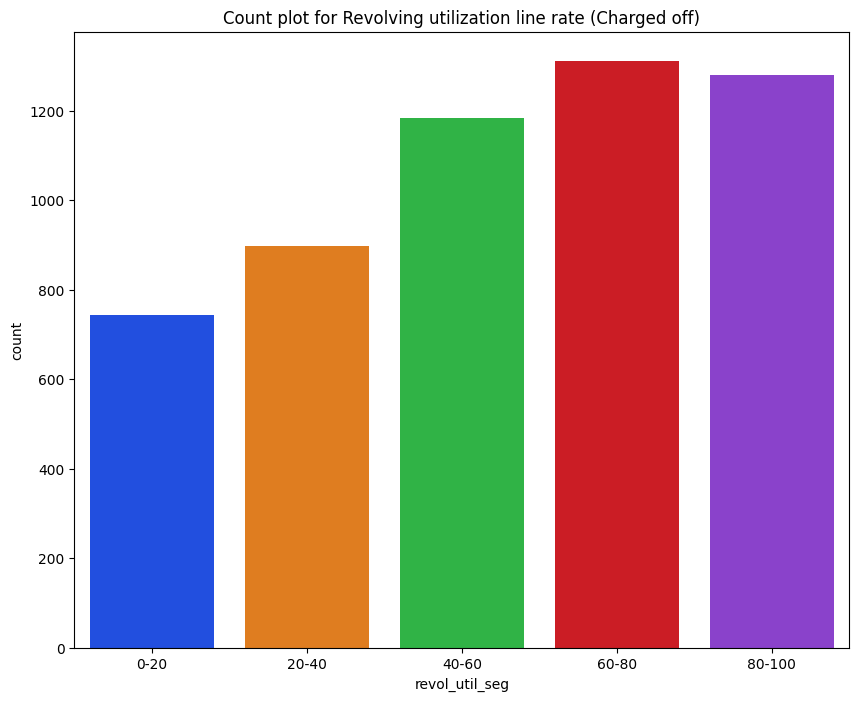

In [74]:
# Plotting count plot for Revolving balance utilization ration
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='revol_util_seg')
plt.title('Count plot for Revolving utilization line rate (Charged off)')
plt.show()

In [75]:
# Creating bins for total_acc column
bins = create_bins(lending_data, 'total_acc', 5, ranges=True)

# Segregating the data into bins
lending_data['total_acc_seg'] = pd.cut(lending_data.total_acc, bins=5,
                                         precision=0, labels=bins)

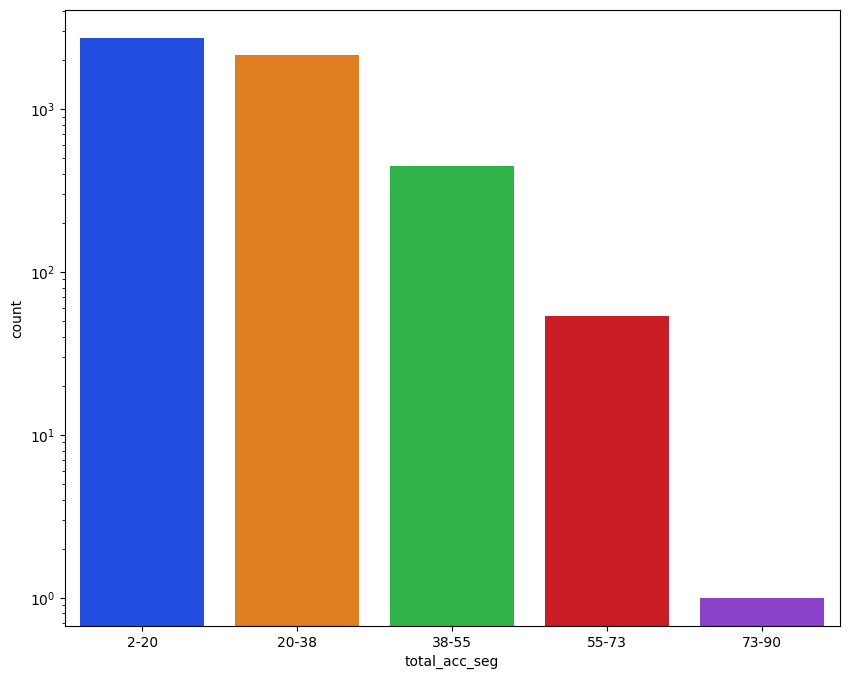

In [76]:
# Plotting count plot for number of total credit account
plt.figure(figsize=(10, 8))
sns.countplot(data=lending_data[lending_data.loan_status == 'Charged Off'],
              x='total_acc_seg')
plt.yscale('log')
plt.show()

### **Some key observations based on the Univariate Analysis**
---
> Probability of Defaulting is more when,
* Borrowers who has Loan term of 36 month
* Borrowers whose income source is not verified
* Borrowers who use their loans to repay other debts.
* Borrowers who has long employment record like 10 years or above
* Borrowers who took Grade B type loan with sub grade is 5
* Borrowers who has home RENT to pay
* Borrowers who has not gone under any inquiry in last 6 months
* In 4th or early 1st Quarter of almost every financial year
* Borrowers paying Installments around 145-270$
* Funded amount by Investors is in 4k-9k range
* Interest rate is in range of 14-17%
* Loan amount is in between 5k-10k
* Annual Income is in range of 32k-60k
* Debt to Income Ratio is in range of 6-12
* Borrower has Open credit lines ranging from 2-11
* Borrower has Revolving line utilization rate in the range of 60-80



### **Multivariate Analysis**

---




* **Annual Income v/s other categories**

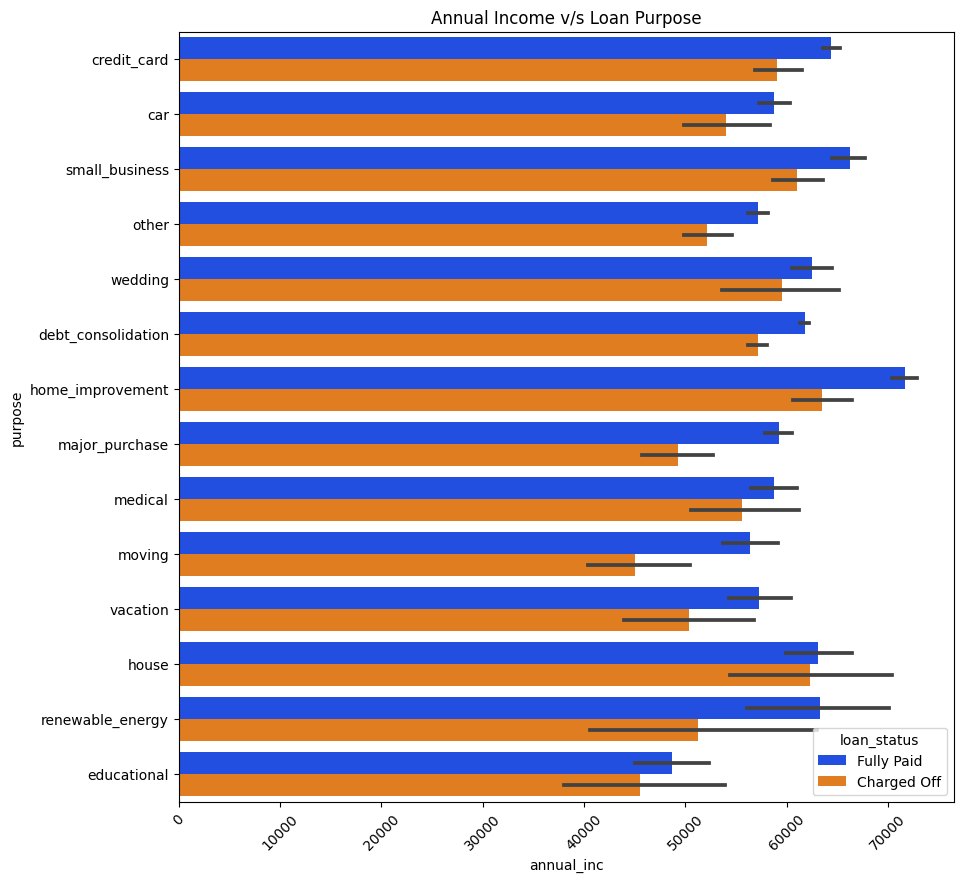

In [77]:
plt.figure(figsize=(10, 10))
sns.barplot(data=lending_data, x='annual_inc', y='purpose', hue='loan_status')
plt.xticks(rotation=45)
plt.title('Annual Income v/s Loan Purpose')
plt.show()

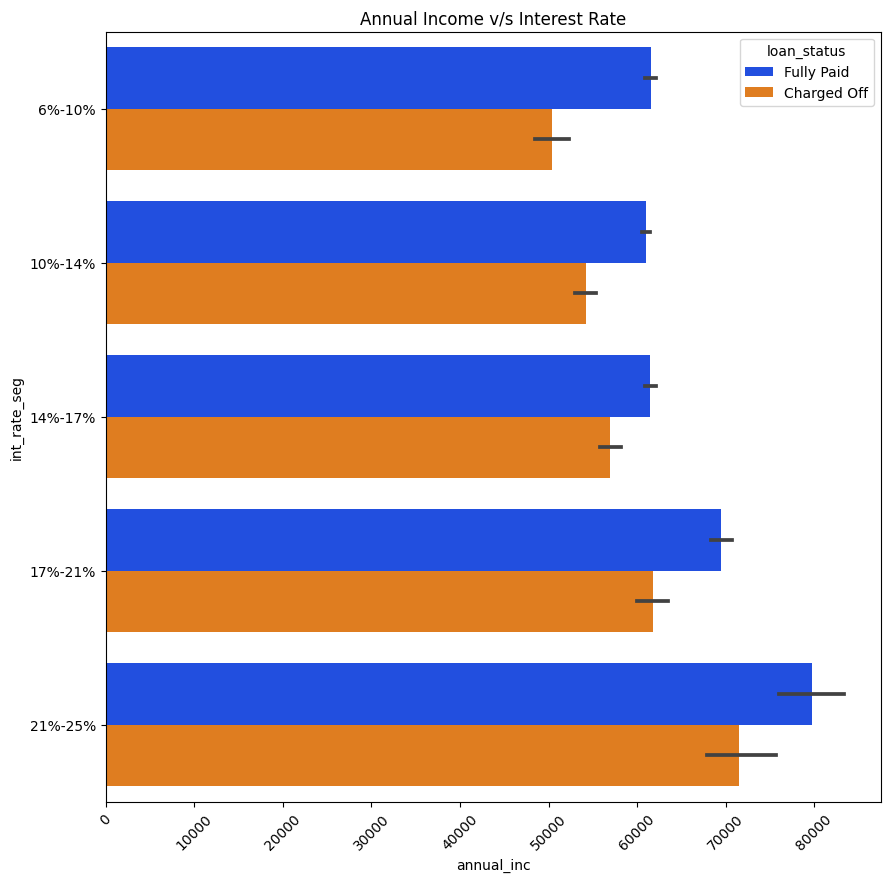

In [89]:
plt.figure(figsize=(10, 10))
sns.barplot(data=lending_data, x='annual_inc', y='int_rate_seg',hue='loan_status')
plt.title('Annual Income v/s Interest Rate')
plt.xticks(rotation=45)
plt.show()

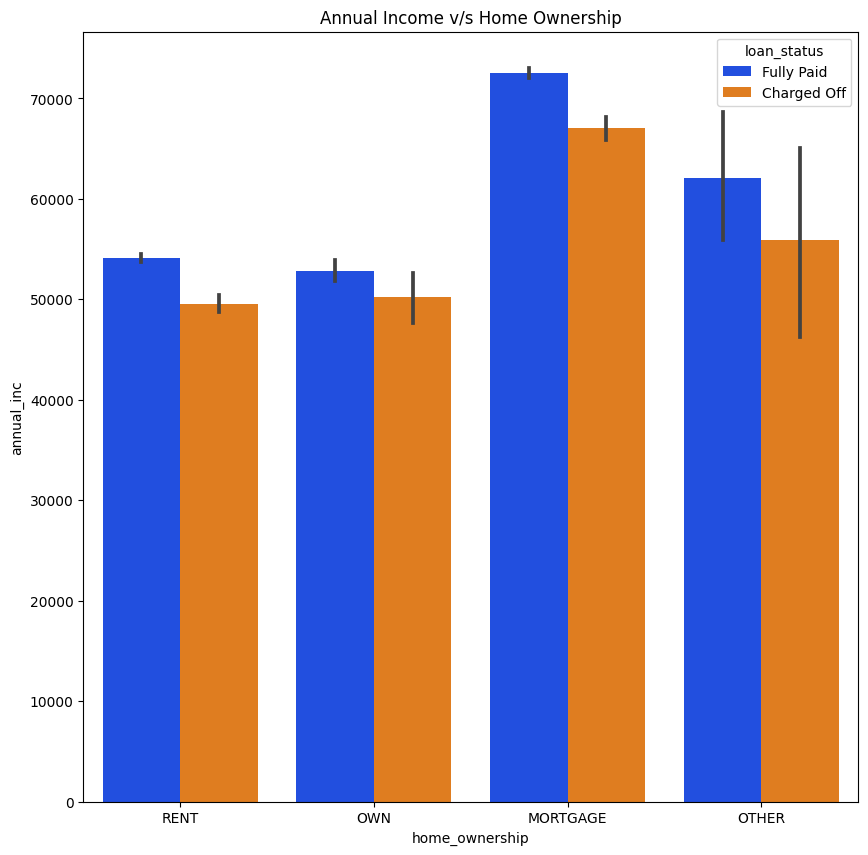

In [93]:
plt.figure(figsize=(10, 10))
sns.barplot(data=lending_data, x='home_ownership', y='annual_inc',hue='loan_status')
plt.title('Annual Income v/s Home Ownership')
plt.show()

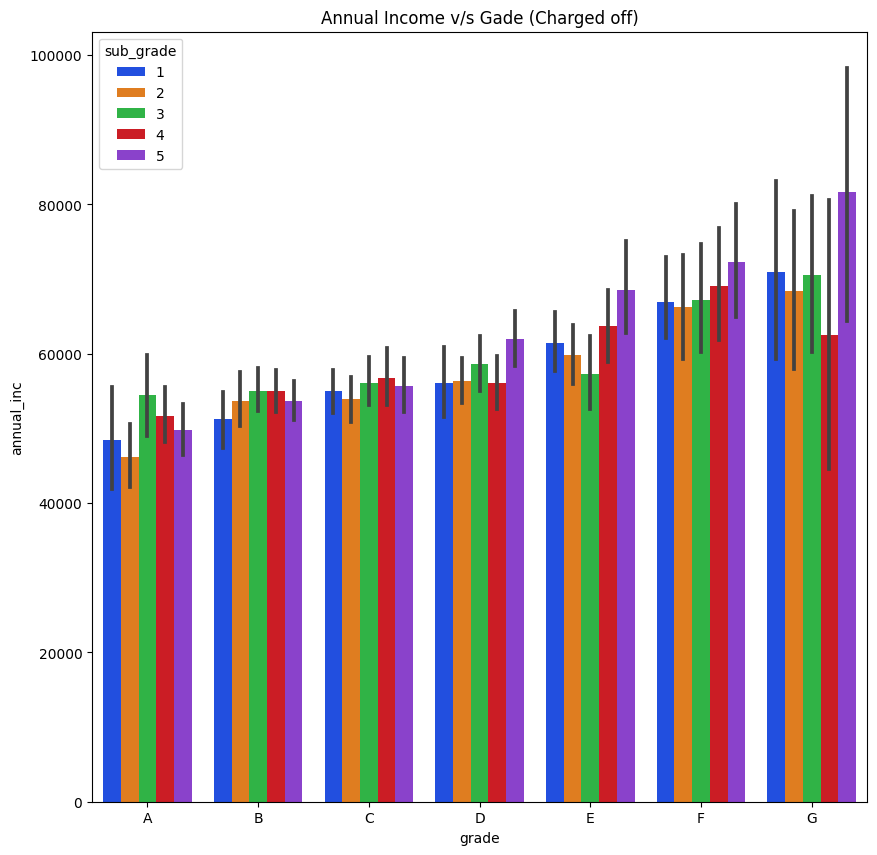

In [110]:
plt.figure(figsize=(10, 10))
sns.barplot(data=lending_data[lending_data.loan_status == 'Charged Off'], x='grade',
            y='annual_inc',hue='sub_grade', order=['A','B','C','D','E','F','G'])
plt.title('Annual Income v/s Gade (Charged off)')
plt.show()

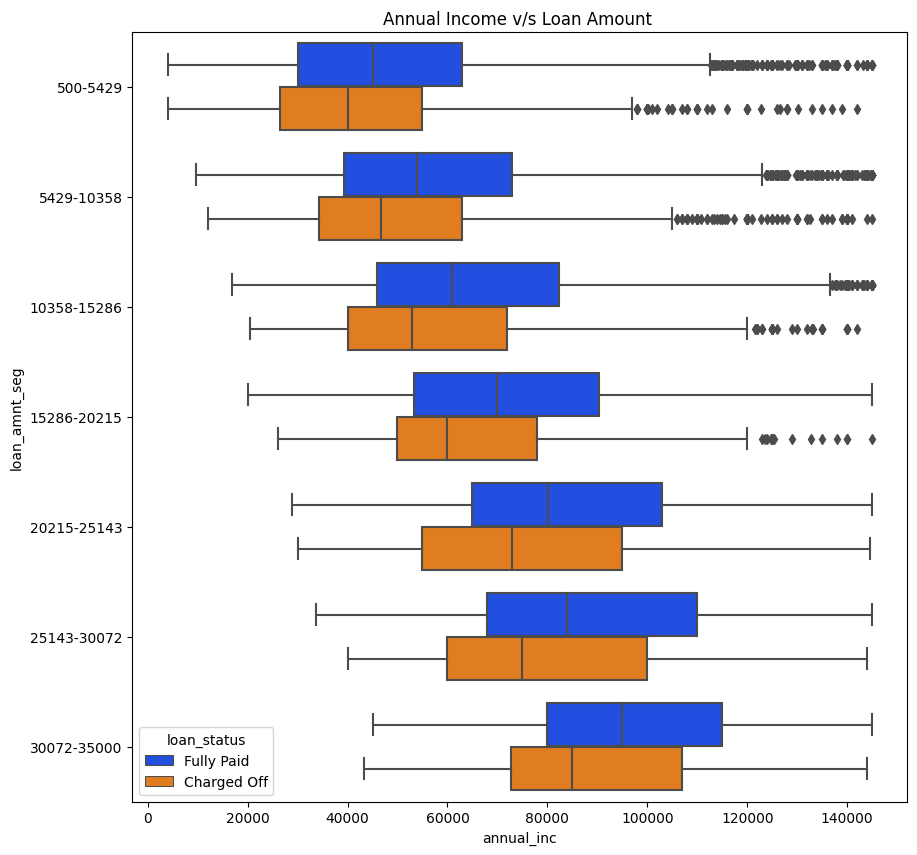

In [102]:
plt.figure(figsize=(10, 10))
sns.boxplot(data=lending_data, x='annual_inc', y='loan_amnt_seg',hue='loan_status')
plt.title('Annual Income v/s Loan Amount ')
plt.show()

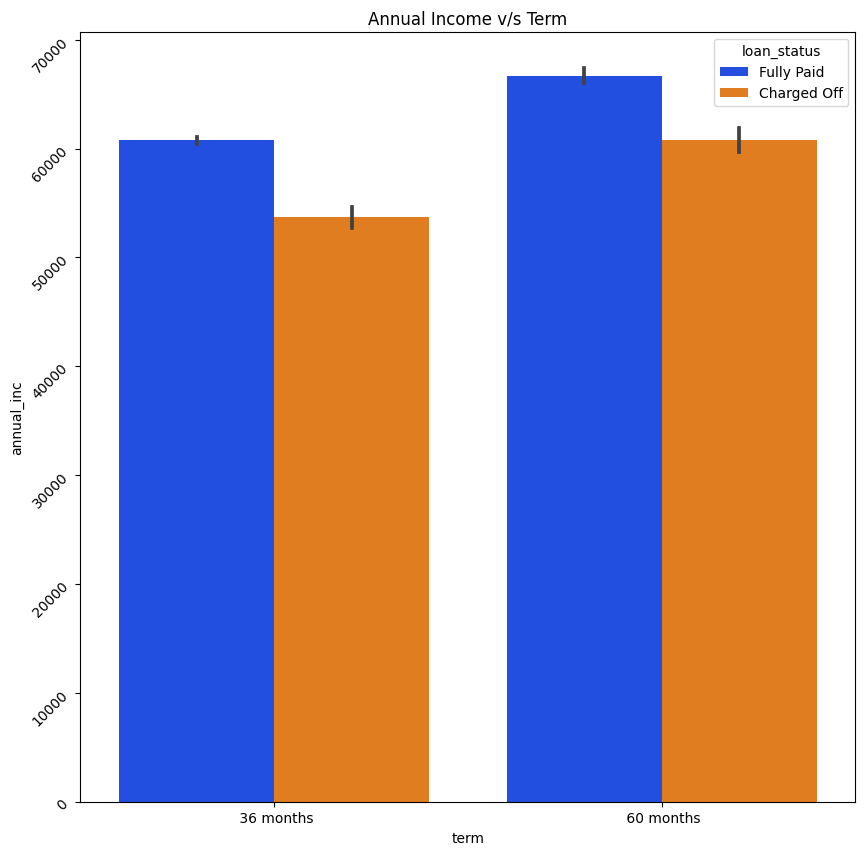

In [103]:
plt.figure(figsize=(10, 10))
sns.barplot(data=lending_data, x='term', y='annual_inc',hue='loan_status')
plt.yticks(rotation=45)
plt.title('Annual Income v/s Term')
plt.show()

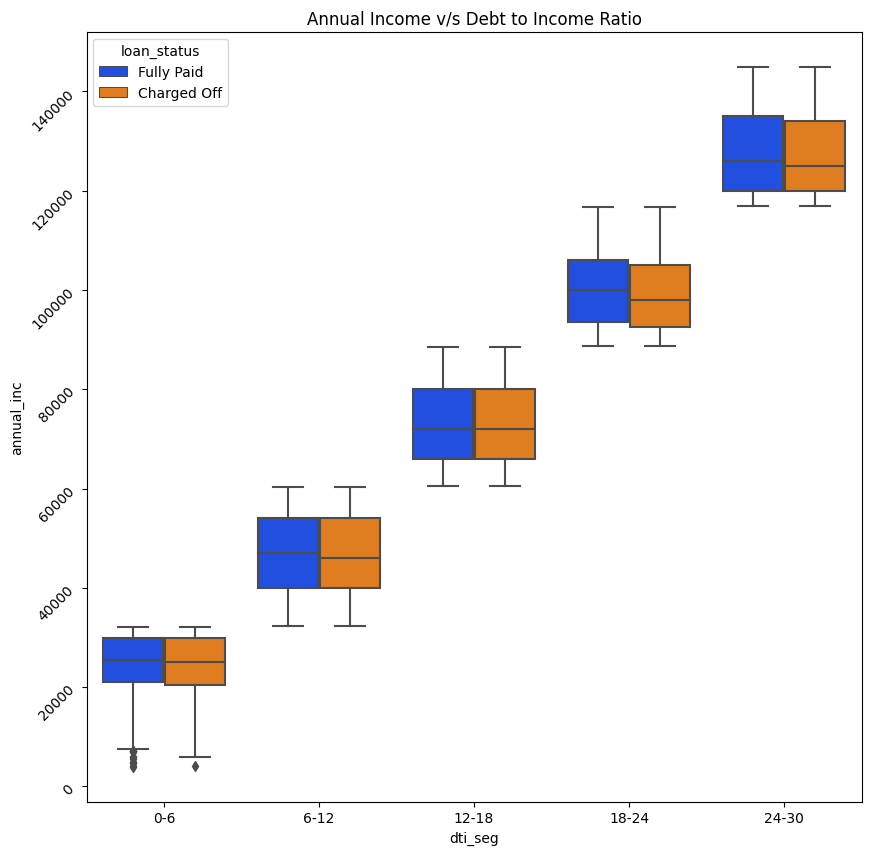

In [104]:
plt.figure(figsize=(10, 10))
sns.boxplot(data=lending_data, y='annual_inc', x='dti_seg',hue='loan_status')
plt.yticks(rotation=45)
plt.title('Annual Income v/s Debt to Income Ratio')
plt.show()

* **Loan amount vs other categories**



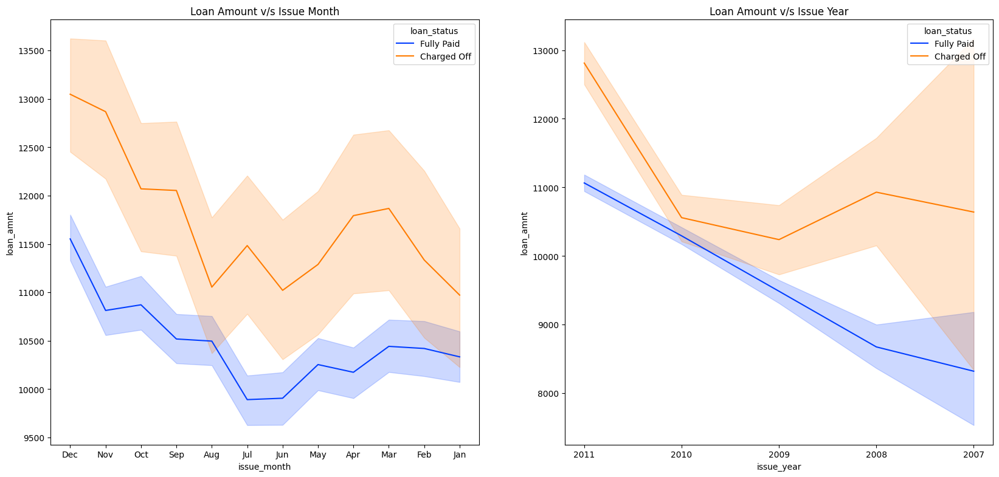

In [105]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.title('Loan Amount v/s Issue Month')
sns.lineplot(data =lending_data,y='loan_amnt', x='issue_month', hue ='loan_status')
plt.subplot(222)
plt.title('Loan Amount v/s Issue Year')
sns.lineplot(data =lending_data,y='loan_amnt', x='issue_year', hue ='loan_status')
plt.show()

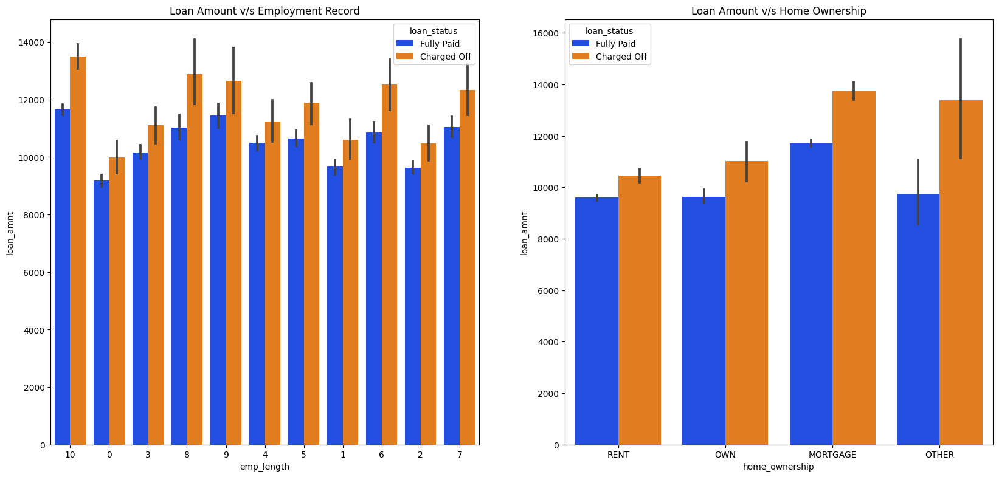

In [106]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.title('Loan Amount v/s Employment Record')
sns.barplot(data=lending_data, x='emp_length',
            y='loan_amnt',hue='loan_status')
plt.subplot(222)
plt.title('Loan Amount v/s Home Ownership')
sns.barplot(data=lending_data, x='home_ownership',
            y='loan_amnt',hue='loan_status')
plt.show()

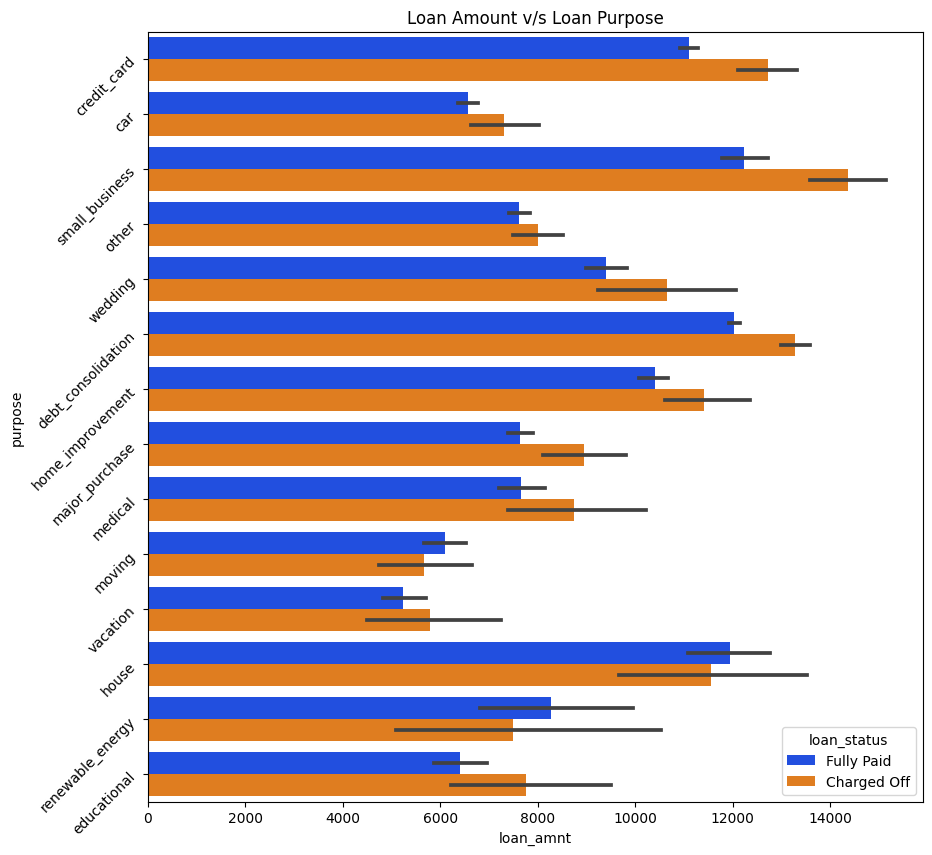

In [108]:
plt.figure(figsize=(10, 10))
sns.barplot(data=lending_data, y='purpose', x='loan_amnt',hue='loan_status')
plt.yticks(rotation=45)
plt.title('Loan Amount v/s Loan Purpose')
plt.show()

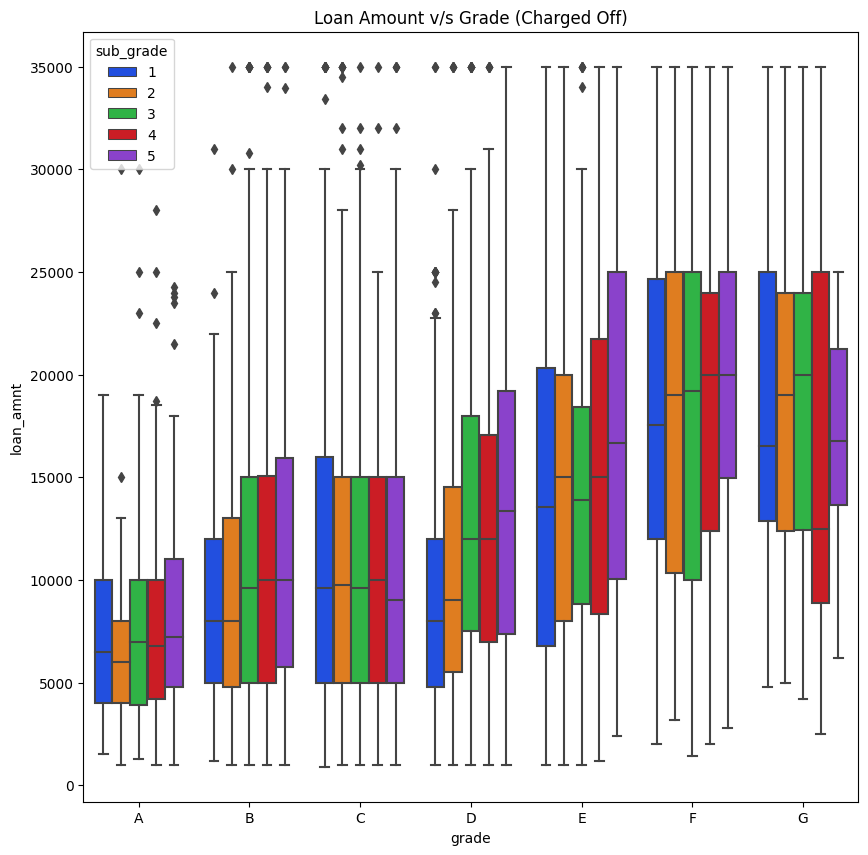

In [109]:
plt.figure(figsize=(10, 10))
sns.boxplot(data=lending_data[lending_data.loan_status == 'Charged Off'], x='grade',
            y='loan_amnt',hue='sub_grade', order=['A','B','C','D','E','F','G'])
plt.title('Loan Amount v/s Grade (Charged Off)')
plt.show()

<Figure size 1000x1000 with 0 Axes>

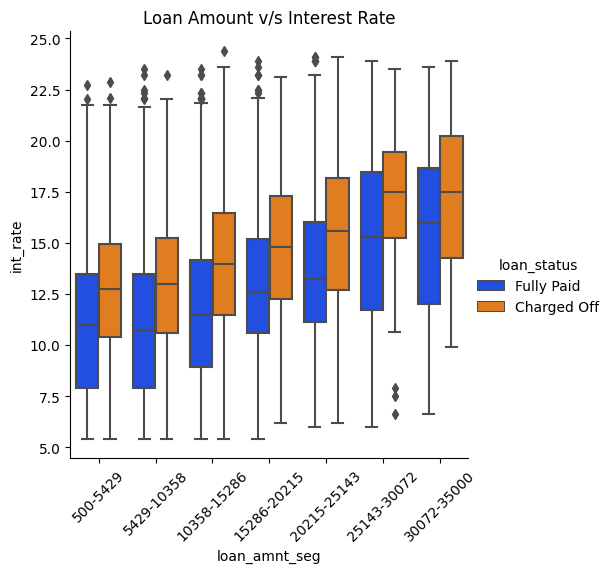

In [111]:
plt.figure(figsize=(10, 10))
sns.catplot(data=lending_data, x='loan_amnt_seg', y='int_rate',hue='loan_status', kind='box')
plt.xticks(rotation=45)
plt.title('Loan Amount v/s Interest Rate')
plt.show()

<Figure size 1000x1000 with 0 Axes>

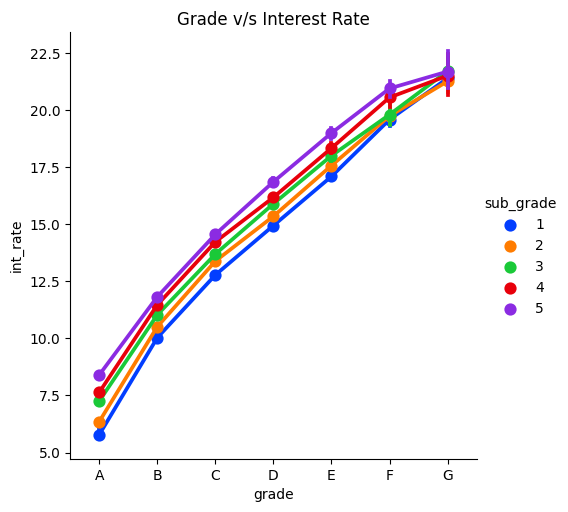

In [112]:
plt.figure(figsize=(10, 10))
sns.catplot(data=lending_data[lending_data.loan_status == 'Charged Off'], x='grade',
            y='int_rate',hue='sub_grade', order=['A','B','C','D','E','F','G'], kind='point')
plt.title('Grade v/s Interest Rate')
plt.show()

### **Some Observation based on the multivariate analysis of the features**

* Findings
  * Possible Remedy
---

> **Probability of Defaulting is more when,**
* Borrower having **Annual income** around **60k-70k** takes the loan for **Home Improvement**  
  * Although risk significantly reduces when the Annual income of borrower exceeds above **70k**.
* The **Interest rate** applied for the loan is around **21%-25%** and borrower falls under the **Income range of 70k-80k**.
  * Although above **80k Annual Income** the risk is low.
* Borrowers having **Home Mortgage** with the **Income range of 60k-70k**
* Borrowers took **loan amount** around **30k-35k** with **Income near to 80k**   
  * Although with **Income** closely around **100k** the risk factor reduce significantly.
* In the **4th Quarter** of the year with the **loan amount** ranging from **12k-13k**
  * although **Loan amount** below **12k** in this period significantly lower the risk.
* **Year on Year** when **loan amount** increase over **11k**
  * Risk is lowering **below 11k** and also the risk threshold is increasing steadly year on year as the number of **fully paid loans** are increasing which is good sign.
* **Small Business** take **loan greater than 14k**
  * Although it can be managed by reducing the **loan amount around 12k** to lower the default risk.
* Borrower with **employment record of 10 years** take **loan of 12k-14k**
* Borrower with **Home Mortgage** took the **loan above 14k**
  * Although the risk reduces with the reduction of loan amount below 12k
* **loan grade** is **F4 or F5** and the **loan amount** taken is in the range of **15k-20k**
* **loan amount** of **30k-35k** taken on the **Interest of 15%-17.5%**
  * But by lowering the interest rate below 15% defaulting risk can be reduced.
* The **Interest rate** ranging from **20%-23%** applied over the 'G' type Loan Grade


